# Bike Sharing Demand Forecasting

*Joshua Ren 3041881898*

*May 07, 2026*


---

In [1]:
from IPython.display import HTML
from data import load_raw_hourly, data_overview
from eda import (
    basic_summary,
    log_dependence_data,
    plot_acf_pacf_diagnostics,
    plot_calendar_patterns,
    plot_demand_scale,
    plot_mean_variance_check,
    plot_weather_relationships,
    plot_welch_periodograms,
    set_analysis_style,
)
from preprocessing import prepare_hourly_data, time_based_split, split_summary
from analysis import make_comparison_table, plot_interactive_model_comparison, plot_model_comparison
from diagnostic import (
    poisson_dispersion_diagnostic,
    plot_residual_diagnostics,
    plot_training_history,
    residual_diagnostics,
)
from arima import plot_arima_order_search, run_arima, run_sarimax
from lagged_regression import lagged_regression_coefficients, run_lagged_regression, run_poisson_lagged_regression
from rnn_lstm import run_lstm_window_search, run_rnn_window_search

set_analysis_style()

---

## 1. Data Loading and Preprocessing

The analysis starts with the raw hourly Bike Sharing Dataset. Before modeling, I need one clean hourly frame with:

- a timestamp index
- complete hourly rows
- predictors that are required in later analysis

---

### 1.1 Raw Data Overview

The hourly file contains the variables listed below. In the analysis, `cnt` is the response variable. The variables `casual` and `registered` are not used as predictors because they sum to `cnt`.

| Variable | Type | Description | Values/Units |
|---|---|---|---|
| `instant` | int | Record index in the original file | 1-17,379 |
| `dteday` | date | Calendar date of the observation | YYYY-MM-DD |
| `season` | int | Season indicator | 1: spring, 2: summer, 3: fall, 4: winter |
| `yr` | int | Year indicator | 0: 2011, 1: 2012 |
| `mnth` | int | Month of year | 1-12 |
| `hr` | int | Hour of day | 0-23 |
| `holiday` | int | Holiday indicator | 1: yes, 0: no |
| `weekday` | int | Day of week | 0-6 |
| `workingday` | int | Working-day indicator | 1: yes, 0: no |
| `weathersit` | int | Categorical weather condition | 1: clear, 2: mist/cloudy, 3: light snow/rain, 4: heavy rain/snow |
| `temp` | float | Normalized temperature | scaled to [0, 1] in source data |
| `atemp` | float | Normalized feeling temperature | scaled to [0, 1] in source data |
| `hum` | float | Normalized humidity | scaled to [0, 1] in source data |
| `windspeed` | float | Normalized wind speed | scaled to [0, 1] in source data |
| `casual` | int | Count of non-registered users | hourly rental count |
| `registered` | int | Count of registered users | hourly rental count |
| `cnt` | int | Total bike rental demand | hourly rental count |

I then load `hour.csv` and build a timestamp from the date and hour columns. The data overview below checks the number of rows, time span, duplicate timestamps, and missing timestamps.

In [2]:
raw_df = load_raw_hourly()
data_overview(raw_df)

rows                                  17379
start_timestamp         2011-01-01 00:00:00
end_timestamp           2012-12-31 23:00:00
duplicate_timestamps                      0
expected_hours                        17544
observed_hours                        17379
missing_hours                           165
dtype: object

The file has 17,379 observed rows from January 1, 2011 to December 31, 2012. There are no duplicate timestamps, but the full hourly range has 17,544 hours, so 165 hours are missing. The modeling frame therefore needs imputation.

---

### 1.2 Preprocess Hourly Data

The preprocessing step includes:

- reindexes to the full hourly grid
- rebuilds calendar fields from the timestamp
- interpolates continuous variables and fills weather category
- keeps only the response, calendar fields, and weather predictors

In [3]:
model_df = prepare_hourly_data(raw_df)
model_df.head()

,cnt,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,windspeed
timestamp,,,,,,,,,,,,
2011-01-01 00:00:00,16.0,1,0,1,0,0,6,0,1.0,0.24,0.81,0.0
2011-01-01 01:00:00,40.0,1,0,1,1,0,6,0,1.0,0.22,0.80,0.0
2011-01-01 02:00:00,32.0,1,0,1,2,0,6,0,1.0,0.22,0.80,0.0
2011-01-01 03:00:00,13.0,1,0,1,3,0,6,0,1.0,0.24,0.75,0.0
2011-01-01 04:00:00,1.0,1,0,1,4,0,6,0,1.0,0.24,0.75,0.0


\newpage

---

## 2. Exploratory Data Analysis

In the EDA stage, I try to find structure in hourly demand that should matter for forecasting. The analysis includes:

- basic data quality
- demand scale
- calendar patterns
- weather patterns
- mean-variance behavior
- time-domain and frequency-domain dependence

---

### 2.1 Basic Summary

Before looking for patterns, I check whether preprocessing produced a complete and reasonable modeling frame. The summary reports missing values and basic ranges for every variable.

In [4]:
basic_summary(model_df)

,count,missing,mean,std,min,25%,50%,75%,max
cnt,17544,0,187.886485,181.278201,1.00,38.0000,140.000,279.0000,977.0000
season,17544,0,2.507524,1.117429,1.00,2.0000,3.000,4.0000,4.0000
yr,17544,0,0.500684,0.500014,0.00,0.0000,1.000,1.0000,1.0000
mnth,17544,0,6.519836,3.449649,1.00,4.0000,7.000,10.0000,12.0000
hr,17544,0,11.500000,6.922384,0.00,5.7500,11.500,17.2500,23.0000
holiday,17544,0,0.028728,0.167045,0.00,0.0000,0.000,0.0000,1.0000
weekday,17544,0,2.997264,2.003472,0.00,1.0000,3.000,5.0000,6.0000
workingday,17544,0,0.683995,0.464928,0.00,0.0000,1.000,1.0000,1.0000
weathersit,17544,0,1.434223,0.648339,1.00,1.0000,1.000,2.0000,4.0000
temp,17544,0,0.495044,0.193192,0.02,0.3400,0.500,0.6600,1.0000


The prepared frame has no missing values. Hourly rentals are nonnegative and right-skewed, with many ordinary hours and a smaller number of peak-demand hours. This supports the idea of log scale for normality.

---

### 2.2 Demand Scale and Overall Time Pattern

After checking completeness, I look at the response itself. This figure shows two views of `cnt`:

- the hourly demand distribution
- the daily average series with a 7-day moving average

The first view gives the demand scale. The second view shows the overall demand trend.

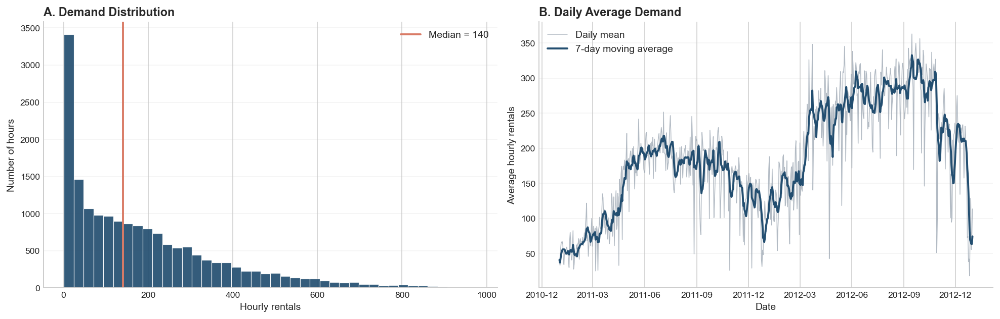

In [5]:
plot_demand_scale(model_df)

Demand is concentrated at low to moderate hourly counts, with a long upper tail during peak periods. The daily average also changes across the two years and across seasons. Later models therefore need to handle both noisy hourly variation and slower calendar movement.

---

### 2.3 Calendar Patterns

The next question is whether demand changes in a regular calendar pattern. I summarize `cnt` in three parallel ways:

- by month
- by weekday and hour
- by hour on working and non-working days

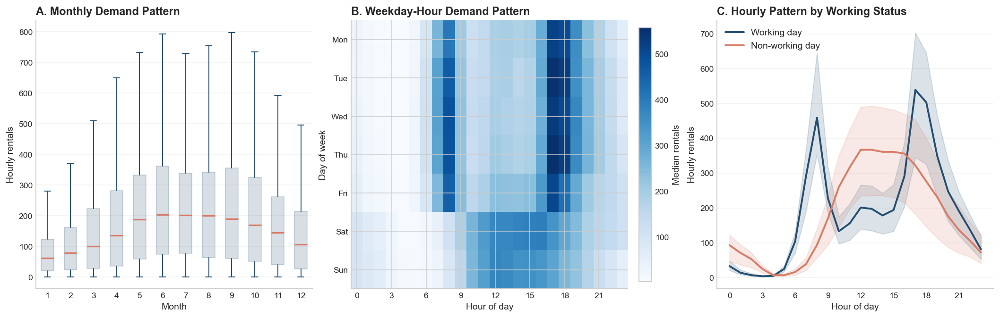

In [6]:
plot_calendar_patterns(model_df)

The calendar patterns are strong:

- demand is higher in warmer months
- weekday-hour demand has clear daily structure
- working days show commute peaks
- non-working days shift demand toward the middle of the day

This is why later models include calendar variables and long lags such as 24 and 168 hours.

---

### 2.4 Weather Relationships

Calendar structure is not the only source of variation, so I also check weather. The plots cover four weather variables:

- binned temperature
- binned humidity
- binned wind speed
- weather condition as a category

For the continuous variables, each bin shows median demand with an IQR band.

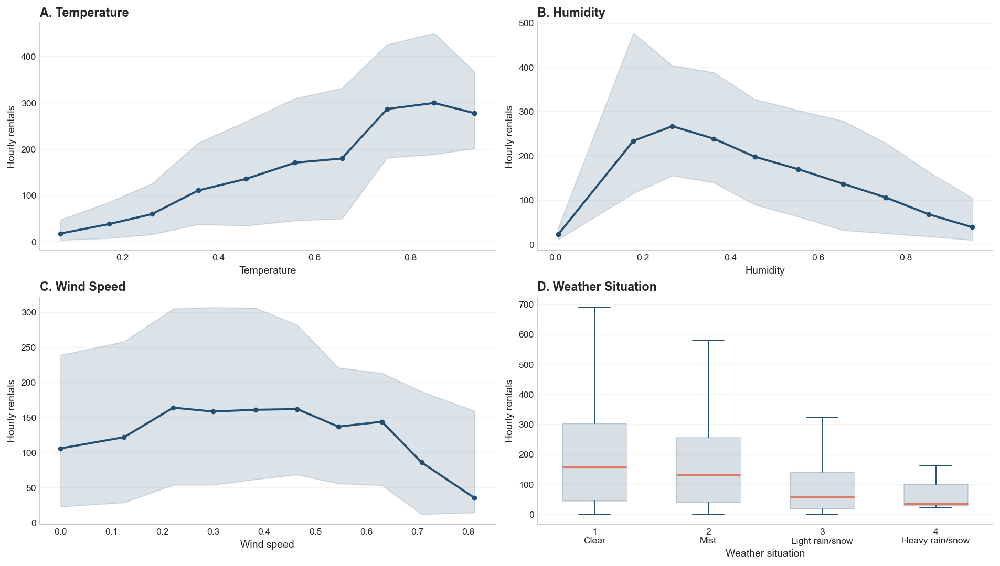

In [7]:
plot_weather_relationships(model_df)

The weather plots show a few useful patterns:

- demand rises with temperature over much of the observed range
- demand tends to fall when humidity is high
- wind speed has a weaker and noisier relationship
- worse weather condition clearly lowers demand

Weather variables are not enough by themselves, but they are useful for regression and SARIMAX.

---

### 2.5 Mean-Variance Relationship

The demand distribution is skewed, so I check whether larger means also come with larger variance. I compare the same rolling diagnostic on two scales:

- raw `cnt`
- `log1p(cnt)`

Both use a 14-day rolling mean and rolling variance.

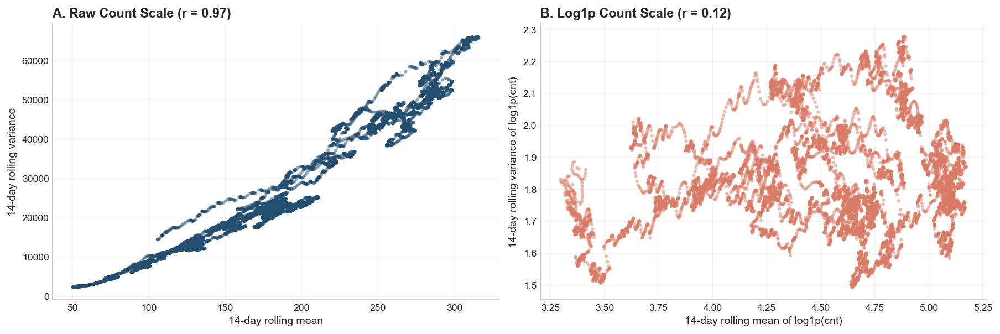

In [8]:
plot_mean_variance_check(model_df)

The raw count scale has a strong mean-variance relationship, while the log scale weakens it substantially. In the subsequent analysis, I still report demand as counts, but the regression and neural models train on `log1p(cnt)` and convert predictions back before evaluation.

---

### 2.6 Autocorrelation and Differencing

#### 2.6.1 Selected Lag Correlations

The calendar plots suggest daily and weekly repetition. I quantify that first at selected lags for three versions of the target:

- `log1p(cnt)`
- first difference of `log1p(cnt)`
- 24-hour difference of `log1p(cnt)`

In [9]:
acf_summary, log_cnt, log_diff_1, log_diff_24 = log_dependence_data(model_df)
acf_summary.round(3)

,log_cnt,log_diff_1,log_diff_24
lag_1,0.900,0.493,0.757
lag_2,0.700,0.185,0.494
lag_3,0.464,-0.091,0.211
lag_24,0.866,0.677,-0.175
lag_48,0.779,0.535,-0.231
lag_168,0.909,0.774,0.438


The selected lags show the main dependence clearly:

- lag 1 is about 0.90 on the log series
- lag 24 is about 0.87
- lag 168 is about 0.91
- first differencing reduces short-lag persistence but leaves daily and weekly dependence
- 24-hour differencing removes more of the daily cycle, but weekly dependence remains

These results motivate both the ARIMA differencing choice and the lag features used later.

#### 2.6.2 Time-domain Analysis

Besides the table above, the full ACF and PACF show the dependence in time domain. I compare the same three series over the same lag range:

- the log series
- the first difference
- the 24-hour difference

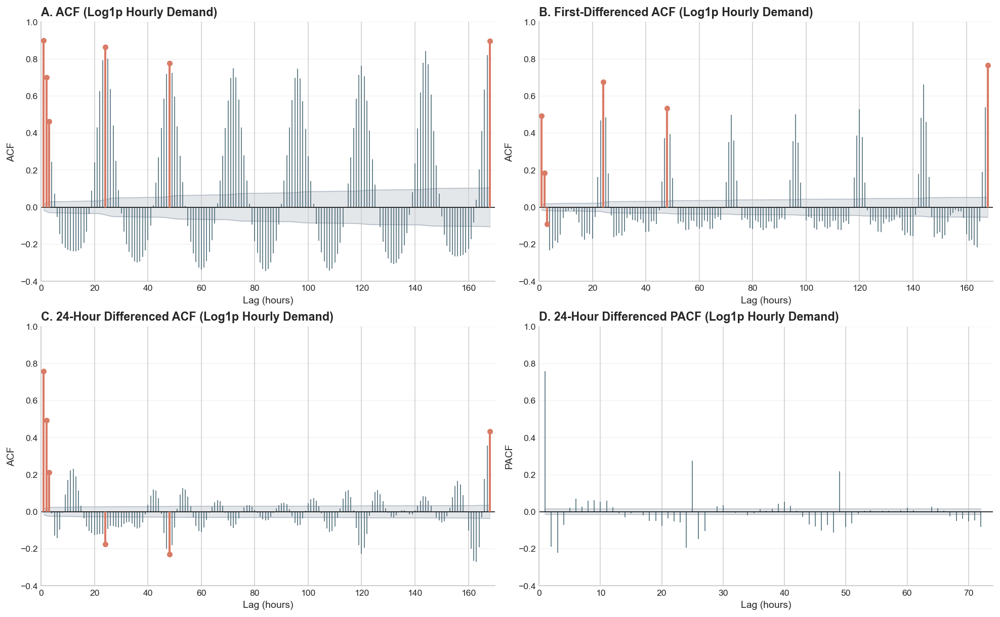

In [10]:
plot_acf_pacf_diagnostics(log_cnt, log_diff_1, log_diff_24)

The raw log series has a slow ACF decay and strong seasonal spikes. After first differencing, short-lag dependence is smaller but the daily pattern remains. The 24-hour difference is a better match for the ARIMA benchmark because it targets the dominant daily repetition directly, while still leaving enough weekly structure to motivate lag features and sequence models.

#### 2.6.3 Frequency-Domain Analysis

The Welch's periodogram checks the same question by frequency.

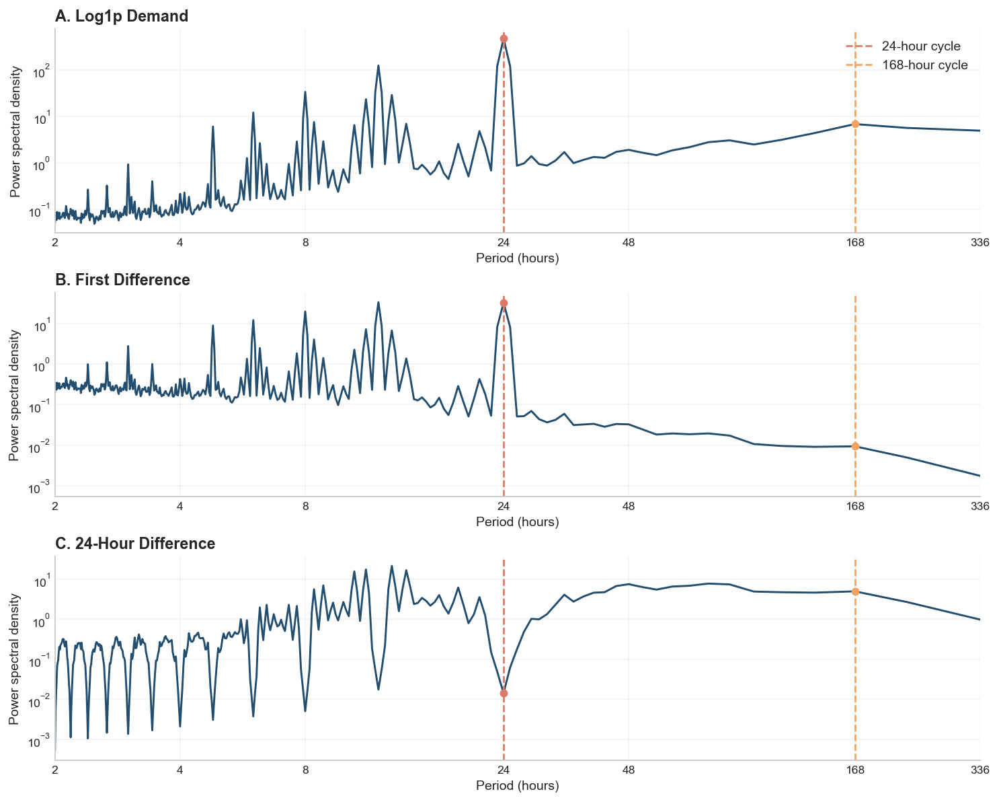

In [11]:
plot_welch_periodograms(log_cnt, log_diff_1, log_diff_24)

The frequency plots confirm that the daily cycle dominates the log demand series. First differencing does not remove that peak cleanly. The 24-hour difference reduces the daily frequency much more directly, which supports using a 24-hour differenced ARIMA benchmark and daily-history features in the later models.

Here, I do not adopt more differencing to avoid introducing MA structure.

\newpage

---

## 3. Models

The models build on the EDA. I compare three forecasting families, each with a baseline method and an extension:

- Classical time-series models:
  - ARIMA as a classical time-series benchmark
  - SARIMAX as a covariate extension
- Regression-based models:
  - lagged regression as an interpretable feature model
  - Poisson lagged regression as a count-model extension
- Neural sequence models:
  - RNN as a neural sequence model
  - LSTM as a gated-memory extension

All models are evaluated on the original count scale with MAE and RMSE. The random seeds are fixed to ensure reproducibility.

Before splitting the data, I set two shared modeling constants:

- `GAP_HOURS = 168`, leaving one week between train, validation, and test
- `USE_CACHE = True`, loading saved results unless I intentionally retrain

In [12]:
GAP_HOURS = 168
USE_CACHE = True

---

### 3.1 Data Split

I use a time-based split rather than a random split because future demand should not be used to predict the past. The split has three parts:

- 60% training
- 20% validation
- 20% test

A 168-hour gap is left before validation and test. Without this gap, there may exist data leakage issue for the time-lagged regression, which used the demand at most 168 hours before as a covariate.

In [13]:
train_df, valid_df, test_df = time_based_split(model_df, gap_hours=GAP_HOURS)
split_summary(train_df, valid_df, test_df)

,rows,start,end,gap_from_previous_hours
train,10526,2011-01-01 00:00:00,2012-03-14 13:00:00,0
validation,3341,2012-03-21 14:00:00,2012-08-07 18:00:00,168
test,3341,2012-08-14 19:00:00,2012-12-31 23:00:00,168


The validation and test sets each contain 3,341 hours. Validation is used for order, window, and model choices. The test set is used only for the final comparison.

---

### 3.2 ARIMA

#### 3.2.1 Prediction

ARIMA is the classical benchmark. The setup includes:

- keep the response on the raw count scale
- use the 24-hour differencing strategy, `cnt_t - cnt_{t-24}`
- search AR and MA orders suggested by the ACF/PACF after differencing
- choose the order by validation RMSE

After 24-hour differencing, the ACF and PACF suggest a low-order ARMA model rather than a high-order one:

- the ACF is still visible at the first few lags, so I include MA terms up to order 2
- the PACF remains noticeable through about lag 3, so I include AR terms up to order 3
- the seasonal difference has already been done, so I keep `d = 0` in the ARMA search

This gives the candidate set `(p, 0, q)` with `p = 1, 2, 3` and `q = 0, 1, 2`.

,order,AIC,BIC,MAE,RMSE
0,"(2, 0, 2)",113984.883038,114028.438964,53.006075,83.496200
1,"(3, 0, 2)",113983.030477,114033.845724,53.018042,83.518843
2,"(3, 0, 1)",114025.005445,114068.561371,53.089709,83.684141
3,"(3, 0, 0)",114033.352489,114069.649094,53.043224,83.692604
4,"(2, 0, 1)",114028.139060,114064.435665,53.089528,83.701354
5,"(2, 0, 0)",114040.104233,114069.141517,52.975246,83.701862
6,"(1, 0, 2)",114038.669255,114074.965860,53.169369,83.825756
7,"(1, 0, 1)",114073.933353,114102.970637,53.396570,84.267212
8,"(1, 0, 0)",114985.676884,115007.454847,54.614901,89.866745


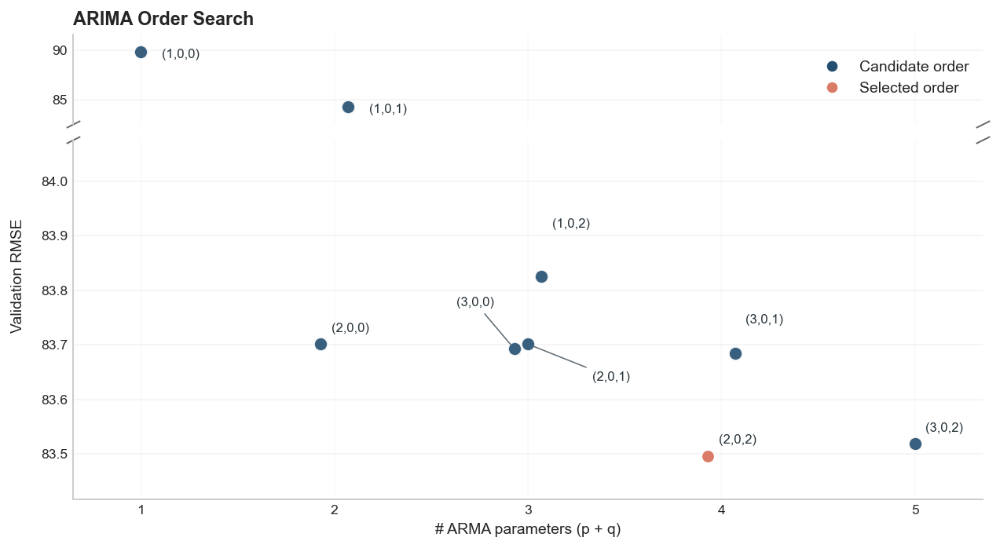

In [14]:
arima_result, arima_order_df = run_arima(
    model_df,
    train_df,
    valid_df,
    test_df,
    use_cache=USE_CACHE,
)
display(arima_order_df)
plot_arima_order_search(arima_order_df)

Based on the validation result, `ARIMA(2,0,2)` gives the lowest validation RMSE, with nearby orders performing very similarly.

I then report ARIMA's validation and test errors on the original count scale. This is the number that can be compared directly with the later regression and neural models.

In [15]:
arima_result["metrics"]

,model,split,MAE,RMSE
0,ARIMA,validation,53.006075,83.496200
1,ARIMA,test,52.560029,84.178415


ARIMA has validation and test RMSE in the low 80s. The errors are stable across validation and test, but still high because the model only uses past demand and does not directly observe calendar or weather variables.

#### 3.2.2 Diagnostics

The main diagnostic question is whether important dependence remains in the residuals. I check:

- residual bias and spread
- residual ACF/PACF at lags 1, 24, and 168
- residuals over time
- residuals against fitted values
- a QQ plot
- residual ACF

,model,split,n,bias,residual_std,MAE,RMSE,acf_lag_1,pacf_lag_1,acf_lag_24,pacf_lag_24,acf_lag_168,pacf_lag_168
0,ARIMA,validation,3341,-0.511,83.507,53.006,83.496,0.066,0.066,-0.192,-0.241,0.444,-0.043


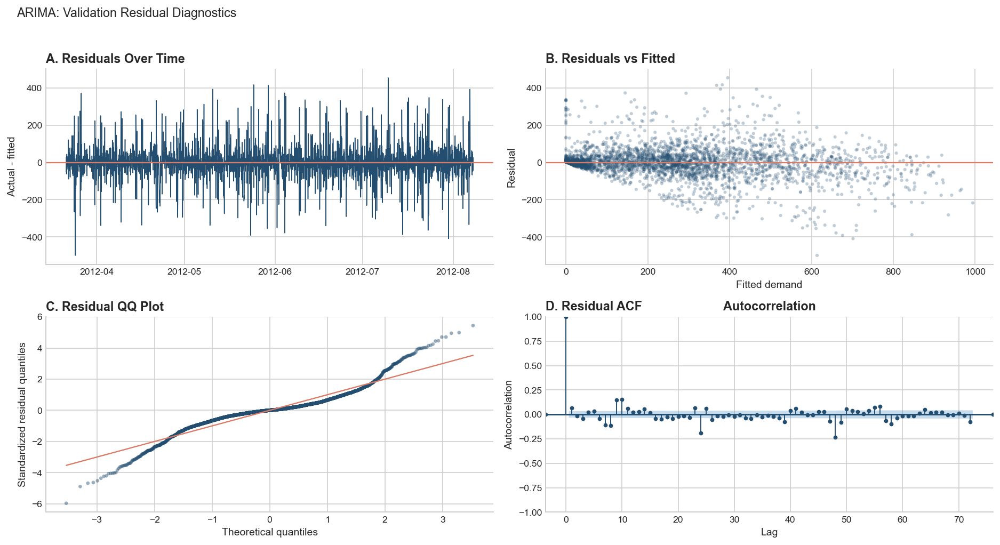

In [16]:
arima_diag = residual_diagnostics(
    valid_df["cnt"],
    arima_result["valid_pred"],
    "ARIMA",
)
display(arima_diag.round(3))
plot_residual_diagnostics(valid_df["cnt"], arima_result["valid_pred"], "ARIMA")

The ARIMA residuals have little average bias, but the weekly residual autocorrelation remains visible. This suggests that daily differencing helps, while the weekly structure and covariate effects are still not fully captured.

---

### 3.3 SARIMAX (Extension)

#### 3.3.1 Prediction

SARIMAX extends ARIMA by adding observed predictors. I keep the 24-hour seasonal structure and add:

- weather variables
- working-day and holiday indicators
- year
- cyclic encodings for hour, weekday, and month

In [17]:
sarimax_result, sarimax_order_df = run_sarimax(
    model_df,
    train_df,
    valid_df,
    test_df,
    use_cache=USE_CACHE,
)
display(sarimax_order_df)
sarimax_result["metrics"]

,order,seasonal_order,AIC,BIC,MAE,RMSE
0,"(2, 0, 2)","(1, 1, 0, 24)",10215.915894,10353.795896,52.229927,80.929478
1,"(2, 0, 1)","(1, 1, 0, 24)",10352.796904,10483.420064,52.380274,81.434533
2,"(1, 0, 1)","(1, 1, 0, 24)",10468.624078,10591.992018,52.882139,82.362757


,model,split,MAE,RMSE
0,SARIMAX,validation,52.229927,80.929478
1,SARIMAX,test,50.802280,81.261162


SARIMAX improves on ARIMA slightly, which means the covariates add information. The gain is modest, though. The model is still mostly driven by the time-series component, and the fitted extension remains less competitive than the feature-based and neural models below.

#### 3.3.2 Diagnostics

The SARIMAX diagnostics use the same residual summary and plots as ARIMA.

,model,split,n,bias,residual_std,MAE,RMSE,acf_lag_1,pacf_lag_1,acf_lag_24,pacf_lag_24,acf_lag_168,pacf_lag_168
0,SARIMAX,validation,3341,-0.225,80.941,52.23,80.929,0.081,0.081,-0.019,-0.079,0.504,0.02


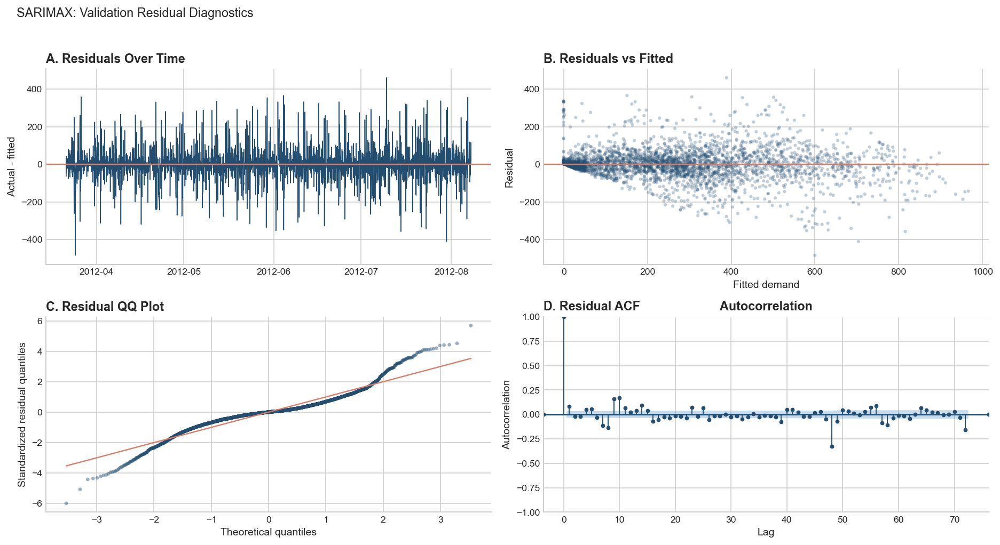

In [18]:
sarimax_diag = residual_diagnostics(
    valid_df["cnt"],
    sarimax_result["valid_pred"],
    "SARIMAX",
)
display(sarimax_diag.round(3))
plot_residual_diagnostics(valid_df["cnt"], sarimax_result["valid_pred"], "SARIMAX")

The residual bias stays close to zero, but the weekly residual dependence is still large. SARIMAX helps with some short-run error, yet it does not remove the repeated weekly structure enough to become the main model.

---

### 3.4 Lagged Regression

#### 3.4.1 Prediction

The lagged regression uses the EDA findings as explicit predictors. The model:

- trains on `log1p(cnt)`
- uses lags 1, 2, 3, 24, and 168
- adds calendar and weather variables
- converts predictions back with `expm1` before scoring

In [19]:
lagged_result = run_lagged_regression(
    model_df,
    train_df,
    valid_df,
    test_df,
    use_cache=USE_CACHE,
)
lagged_result["metrics"]

,model,split,MAE,RMSE
0,Lagged Regression,validation,43.313854,65.700413
1,Lagged Regression,test,37.964395,59.397998


Lagged regression improves substantially over ARIMA and SARIMAX. The improvement is expected because the model can use recent demand, daily history, weekly history, and observed covariates at the same time.

#### 3.4.2 Diagnostics

I next check whether the regression errors still have structure.

,model,split,n,bias,residual_std,MAE,RMSE,acf_lag_1,pacf_lag_1,acf_lag_24,pacf_lag_24,acf_lag_168,pacf_lag_168
0,Lagged Regression,validation,3341,-11.074,64.77,43.314,65.7,0.323,0.323,0.244,0.127,0.335,0.131


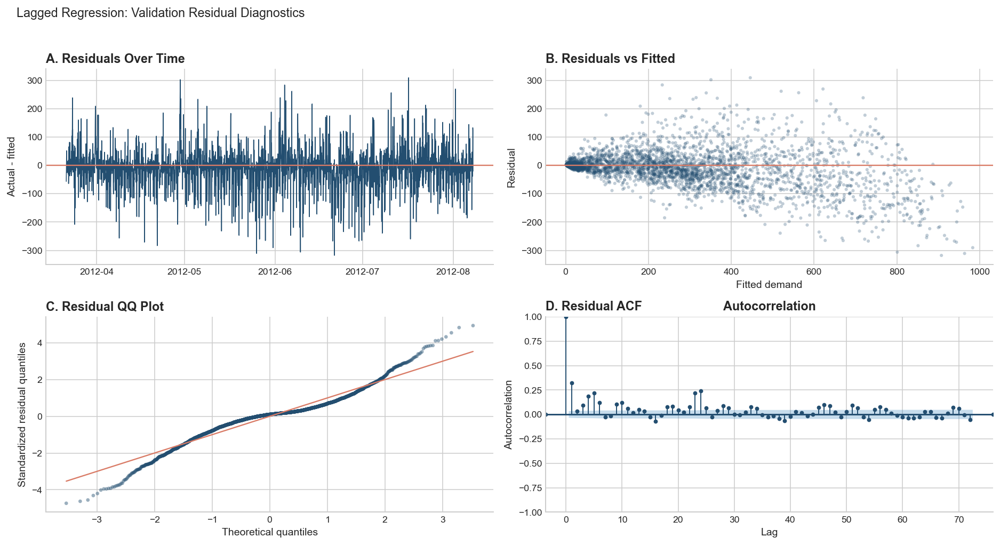

In [20]:
lagged_diag = residual_diagnostics(
    valid_df["cnt"],
    lagged_result["valid_pred"],
    "Lagged Regression",
)
display(lagged_diag.round(3))
plot_residual_diagnostics(valid_df["cnt"], lagged_result["valid_pred"], "Lagged Regression")

The model reduces forecast error, but residual autocorrelation remains at short, daily, and weekly lags. The residuals also show some systematic spread, so the linear feature form is useful but not flexible enough to capture all peak-hour behavior.

#### 3.4.3 Interpretation

Because this model is interpretable, I refit the same design with `statsmodels` and inspect coefficient significance.

In [21]:
lagged_coef_df = lagged_regression_coefficients(model_df, train_df)
lagged_coef_df.round({"coef": 3, "std_err": 3, "p_value": 4})

,term,coef,std_err,p_value,sig
0,const,0.455,0.059,0.0000,***
1,yr,0.117,0.017,0.0000,***
2,holiday,-0.042,0.031,0.1826,
3,workingday,0.026,0.011,0.0228,*
4,temp,0.536,0.056,0.0000,***
5,hum,-0.125,0.038,0.0011,**
6,windspeed,-0.157,0.046,0.0006,***
7,log_lag_1,0.741,0.019,0.0000,***
8,log_lag_2,-0.025,0.017,0.1410,
9,log_lag_3,-0.197,0.012,0.0000,***


The coefficients mostly line up with the EDA:

- recent, daily, and weekly lags are positive and significant
- temperature contributes positively
- humidity tends to reduce demand
- calendar terms capture working-day and seasonal differences

This gives the regression a clear explanation, even though it is not the best forecaster.

---

### 3.5 Poisson Lagged Regression (Extension)

#### 3.5.1 Prediction

Since we are dealing with count data, the Poisson regression may be a natural choice.

The Poisson lagged regression keeps the same predictors as the log-linear model but changes the response model:

- hourly rentals are treated as counts
- the response is not log-transformed by hand
- the Poisson GLM uses a log link internally

In [22]:
poisson_result, poisson_dispersion_df = run_poisson_lagged_regression(
    model_df,
    train_df,
    valid_df,
    test_df,
    use_cache=USE_CACHE,
)
poisson_result["metrics"]

,model,split,MAE,RMSE
0,Poisson Lagged Regression,validation,41.928565,62.080639
1,Poisson Lagged Regression,test,37.772709,57.771636


The Poisson model performs a little better than the ordinary lagged regression in RMSE. This suggests that a count-model likelihood is a reasonable extension.

#### 3.5.2 Diagnostics

For diagnostics, I use the same residual plots and add a dispersion check. The dispersion check matters because a plain Poisson model assumes conditional mean equals conditional variance, which may not be ture for my data.

,model,split,n,bias,residual_std,MAE,RMSE,acf_lag_1,pacf_lag_1,acf_lag_24,pacf_lag_24,acf_lag_168,pacf_lag_168
0,Poisson Lagged Regression,validation,3341,-18.705,59.205,41.929,62.081,0.191,0.191,0.255,0.174,0.395,0.199


,pearson_chi2,df_resid,dispersion,assessment
0,73527.0655,10304,7.1358,overdispersion


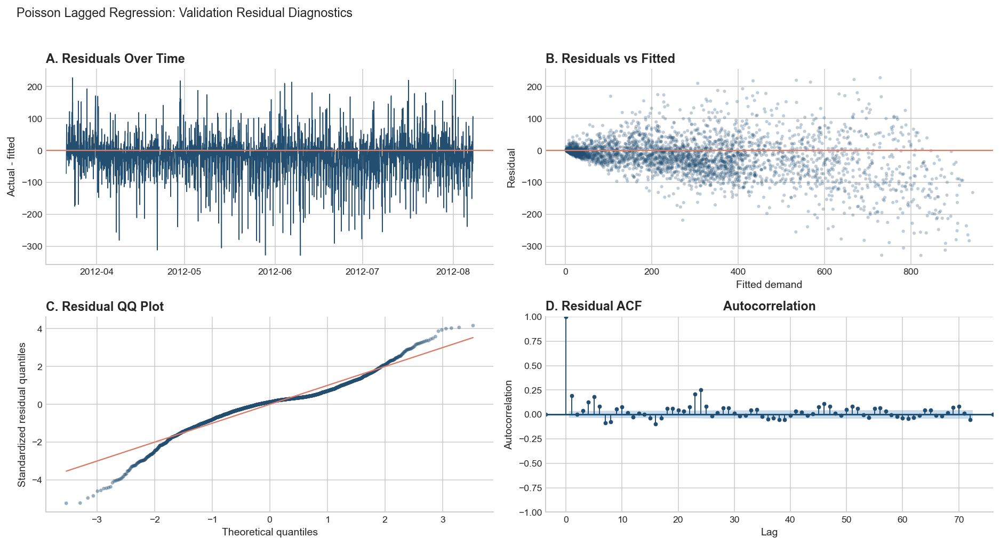

In [23]:
poisson_diag = residual_diagnostics(
    valid_df["cnt"],
    poisson_result["valid_pred"],
    "Poisson Lagged Regression",
)
poisson_dispersion_check = poisson_dispersion_diagnostic(poisson_dispersion_df)
display(poisson_diag.round(3))
display(poisson_dispersion_check.round(4))
plot_residual_diagnostics(
    valid_df["cnt"],
    poisson_result["valid_pred"],
    "Poisson Lagged Regression",
)

The dispersion statistic is about 7, which is far above 1. The Poisson model can still forecast reasonably well, but the variance assumption is too tight for this data. A negative binomial model would be a natural extension, so I keep it as the future work.

---

### 3.6 RNN

#### 3.6.1 Prediction

The RNN is the first neural sequence model. Instead of using only fixed lag columns, it reads a rolling history window and combines that history with target-time weather and calendar features.

The model setup is:

- input windows: 24, 72, and 168 hours
- recurrent layer: one-layer tanh RNN
- hidden size: 32
- prediction head: last hidden state plus target-time features, followed by a small ReLU feed-forward layer
- target: scaled `log1p(cnt)`
- optimizer and loss: Adam with learning rate 0.001, MSE loss
- training: 40 epochs, batch size 256, seed 248

The selected window is the one with the lowest validation RMSE after converting predictions back to the count scale.

In [24]:
rnn_result, rnn_window_df = run_rnn_window_search(
    model_df,
    train_df,
    valid_df,
    test_df,
    use_cache=USE_CACHE,
)
rnn_window_df

,window,val_MAE,val_RMSE,test_MAE,test_RMSE
0,72,34.691691,55.428970,33.967909,55.177538
1,24,34.691357,55.470388,34.015085,55.321681
2,168,34.836272,55.618897,34.025396,55.241811


The 72-hour window is selected for the RNN. It is long enough to cover several daily cycles without making the sequence as hard to train as a full week. The RNN improves over the regression models, but it still leaves room for a gated sequence model.

#### 3.6.2 Diagnostics

For the selected RNN, I check two things:

- the training curve, to see whether validation loss has stabilized
- residual diagnostics, to see what structure remains in the forecasts

,model,split,n,bias,residual_std,MAE,RMSE,acf_lag_1,pacf_lag_1,acf_lag_24,pacf_lag_24,acf_lag_168,pacf_lag_168
0,RNN (window=72),validation,3341,8.55,54.774,34.692,55.429,0.31,0.31,0.283,0.223,0.404,0.168


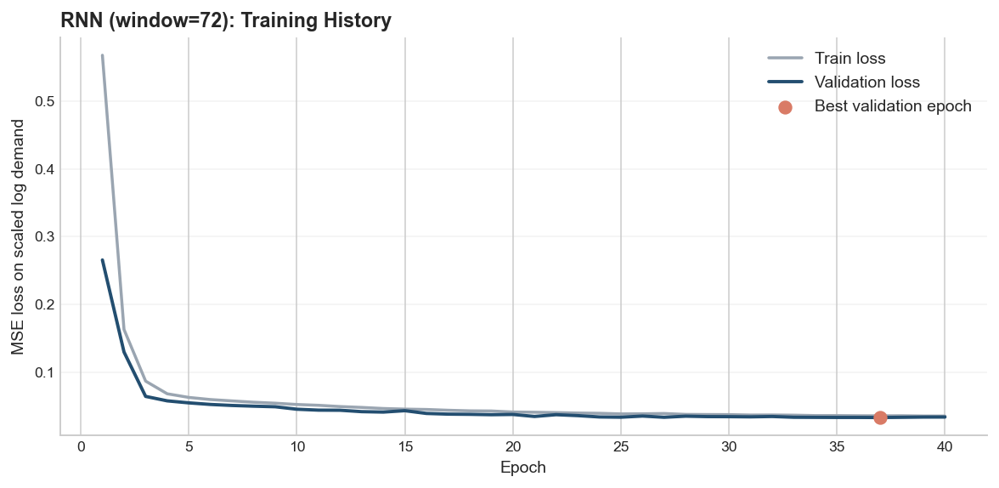

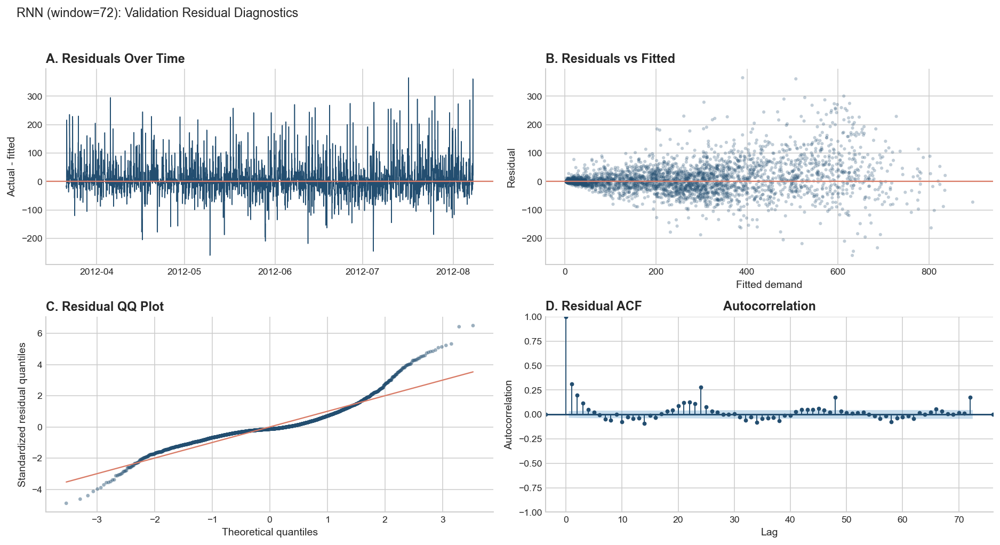

In [25]:
rnn_diag = residual_diagnostics(
    valid_df["cnt"],
    rnn_result["valid_pred"],
    rnn_result["name"],
)
display(rnn_diag.round(3))
plot_training_history(rnn_result)
plot_residual_diagnostics(valid_df["cnt"], rnn_result["valid_pred"], rnn_result["name"])

The training curve is stable, and the RNN lowers forecast error compared with the lagged regressions. Residual autocorrelation is still present, especially around recurring calendar patterns, so the model is not fully absorbing the repeated structure.

---

### 3.7 LSTM

#### 3.7.1 Prediction

The LSTM uses the same sequence construction as the RNN, but replaces the simple recurrent layer with gated LSTM layers. This gives the model a more flexible way to decide what information from the recent history should be kept or forgotten.

The LSTM setup is:

- input windows: 24, 72, and 168 hours
- recurrent layer: two-layer LSTM
- hidden size: 96
- dropout: 0.15
- prediction head: last LSTM state plus target-time features, followed by a small ReLU feed-forward layer
- target: scaled `log1p(cnt)`
- optimizer and loss: Adam with learning rate 0.0008, MSE loss
- training: 80 epochs, batch size 128, seed 248

As with the RNN, the best epoch is chosen by validation loss, and the final window is chosen by validation RMSE on the original count scale.

In [26]:
lstm_result, lstm_window_df = run_lstm_window_search(
    model_df,
    train_df,
    valid_df,
    test_df,
    use_cache=USE_CACHE,
)
lstm_window_df

,window,val_MAE,val_RMSE,test_MAE,test_RMSE
0,72,28.221092,43.503915,27.683891,43.879932
1,24,28.623689,44.195318,27.991613,44.036397
2,168,28.756665,44.200422,27.338207,43.044543


The LSTM also selects a 72-hour window and gives the strongest validation RMSE among the main models. The improvement over the RNN suggests that the gated architecture is useful for this hourly demand series.

#### 3.7.2 Diagnostics

The LSTM diagnostics mirror the RNN diagnostics. I check:

- the training curve
- residual bias and spread
- residual autocorrelation at the main lags
- the residual plots on the validation period

,model,split,n,bias,residual_std,MAE,RMSE,acf_lag_1,pacf_lag_1,acf_lag_24,pacf_lag_24,acf_lag_168,pacf_lag_168
0,LSTM (window=72),validation,3341,1.582,43.482,28.221,43.504,0.268,0.268,0.117,0.053,0.214,0.112


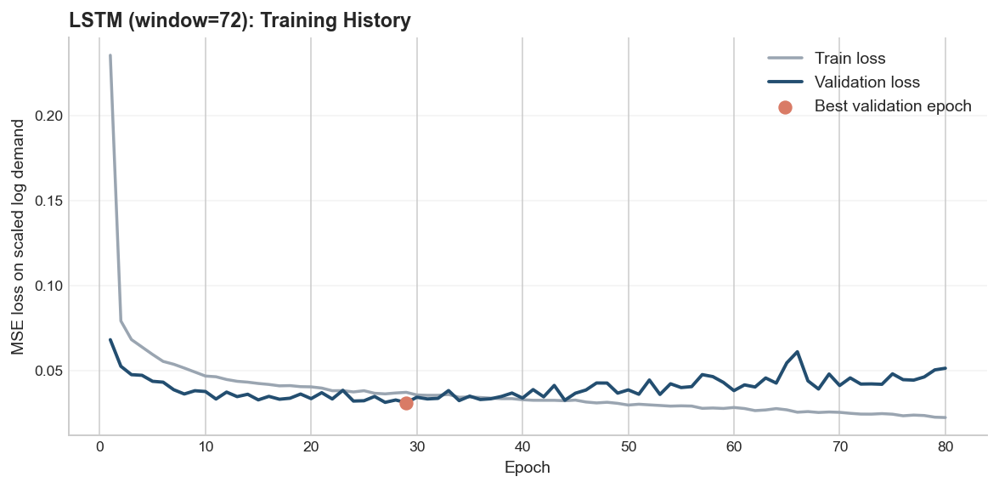

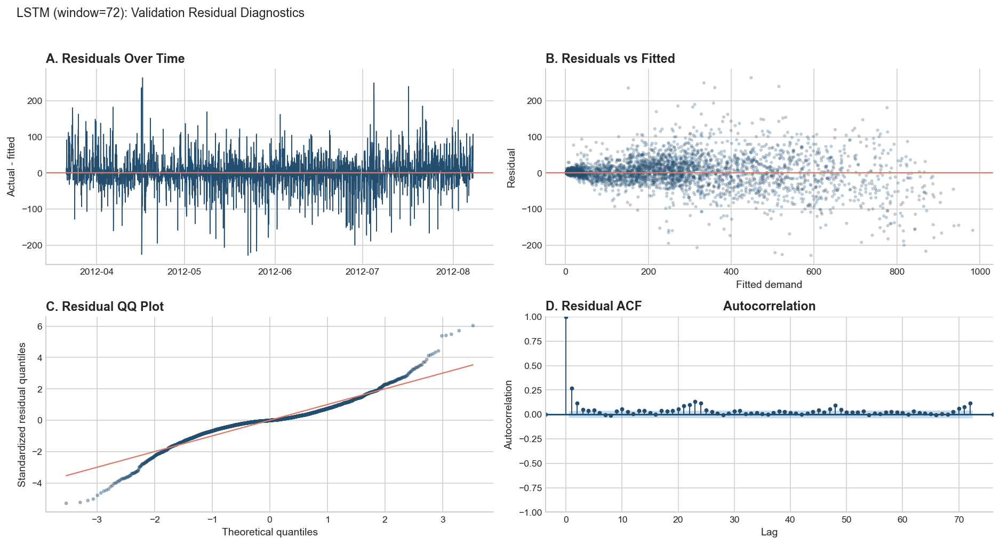

In [27]:
lstm_diag = residual_diagnostics(
    valid_df["cnt"],
    lstm_result["valid_pred"],
    lstm_result["name"],
)
display(lstm_diag.round(3))
plot_training_history(lstm_result)
plot_residual_diagnostics(valid_df["cnt"], lstm_result["valid_pred"], lstm_result["name"])

The LSTM has the smallest residual spread among the fitted models and much lower RMSE than the classical benchmarks. Some autocorrelation remains, but it is reduced enough.

---

### 3.8 Model Comparison

#### 3.8.1 Metric Table

The final comparison table puts every model on the same validation and test periods.

In [28]:
model_results = [arima_result, sarimax_result, lagged_result, poisson_result, rnn_result, lstm_result]

comparison_df = make_comparison_table(model_results)
comparison_df

,model,split,MAE,RMSE
0,LSTM (window=72),validation,28.221092,43.503915
1,RNN (window=72),validation,34.691691,55.428970
2,Poisson Lagged Regression,validation,41.928565,62.080639
3,Lagged Regression,validation,43.313854,65.700413
4,SARIMAX,validation,52.229927,80.929478
5,ARIMA,validation,53.006075,83.496200
6,LSTM (window=72),test,27.683891,43.879932
7,RNN (window=72),test,33.967909,55.177538
8,Poisson Lagged Regression,test,37.772709,57.771636
9,Lagged Regression,test,37.964395,59.397998


The comparison table has a clear pattern:

- ARIMA and SARIMAX are useful baselines
- lagged regression and Poisson regression improve by using explicit predictors
- the neural sequence models perform best
- the LSTM has the lowest validation error and remains strong on the test set

#### 3.8.2 Forecast Plots

A table is useful for ranking models, but it does not show where errors occur. I plot one test week so peak hours, low-demand periods, and timing errors can be checked visually.

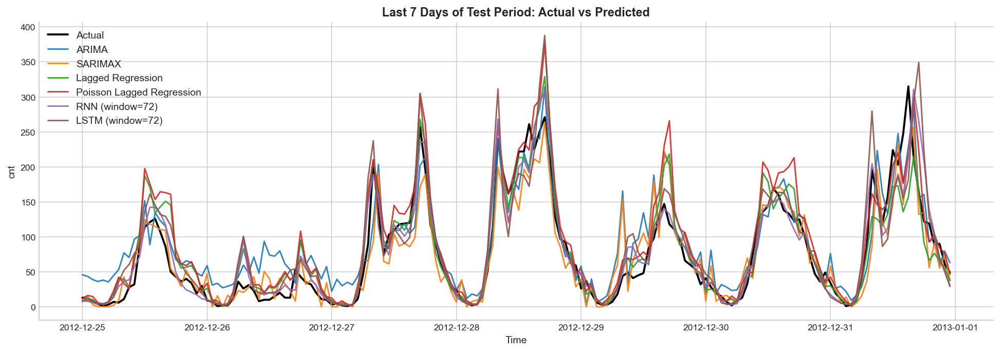

In [29]:
ax = plot_model_comparison(test_df["cnt"], model_results, split="test", days=7)

The static forecast plot shows that many model lines overlap, especially outside peak periods. It is enough to see broad tracking, but it is too crowded for comparing individual models carefully.

The interactive version keeps the same actual-versus-predicted comparison but adds two controls:

- one dropdown for the time window
- one dropdown for highlighting a model

This makes short and longer test-period behavior easier to inspect.

In [30]:
interactive_fig = plot_interactive_model_comparison(
    test_df["cnt"],
    model_results,
    split="test",
    days=7,
    window_options=(7, 14, 30, 60),
)
HTML(interactive_fig.to_html(include_plotlyjs=True, full_html=False))